# Advanced Lane Finding Project

## By Bowen Kuang

This is the submission notebook for the advanced lane finding project. This project consists of 3 main component: 
1. camera calibration 
2. pipeline for finding lanes in a single image 
3. pipeline for finding lanes in a video.

The first and third components are pretty straight forward, and the pipeline for finding lanes in a single image can be roughly broken down into the following steps: 
1. distortion correction 
2. thresholding for lane line pixels 
3. perspective transformation to bird-eye view 
4. fitting lane pixels to polynomial 
5. applying reverse perspective transformation to the fitted lane line.

##  Camera calibration

Use opencv APIs to compute the camera calibration matrix and distortion coefficients. 


In [2]:
import os
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from scipy.signal import find_peaks_cwt
%matplotlib inline

# Load chessboard images
fname = 'camera_cal/calibration{}.jpg'.format(3)
img = cv2.imread(fname)

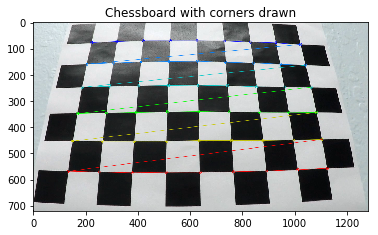

In [3]:
# convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
# find chessboard corners
ret, corners = cv2.findChessboardCorners(gray, (9,6), None)# 9 per row, 6 per col

if ret:
    #if there are corners, draw it
    cv2.drawChessboardCorners(img, (9,6), corners, ret)
    plt.imshow(img)
    plt.title("Chessboard with corners drawn")
    plt.show()

### Define functions for correcting distortion and test them on an image

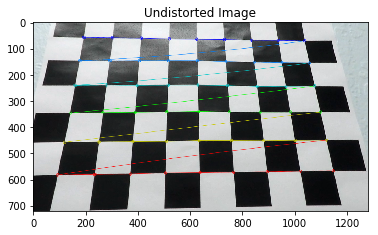

In [4]:
def find_img_points(nx = 9, ny = 6, numImages = 20, caliFolder = 'camera_cal'):
    #Prepare objPoints and imgPoints for calibration.
    objPoints = [] # 3-D points in real world space
    imgPoints = [] # 2-D points in image plane

    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

    # treverse all the calibration images
    for i in range(1,numImages+1):
        fname =  (caliFolder + '/calibration{}.jpg').format(i)
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        # find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
        if ret == True:
            #if there are corners, append imgPoints annd objPoints
            objPoints.append(objp)
            imgPoints.append(corners)
    return objPoints,imgPoints



        
def cal_undistort(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

# test undistortion for the loaded image
objPoints, imgPoints = find_img_points()
# calculate the camera matrix and distortion coefficients
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objPoints, imgPoints, gray.shape[::-1], None, None)
# save the undistortion parameters
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "wide_dist_pickle.p", "wb" ) )
undistortedImg = cal_undistort(img, mtx, dist)
plt.imshow(undistortedImg)
plt.title("Undistorted Image")
plt.show()

## Pipeline for finding lanes in a single image
The pipleline can be roughly broken down into the following steps: 
1. distortion correction 
2. thresholding for lane line pixels 
3. perspective transformation to bird-eye view 
4. fitting lane pixels to polynomial 
5. applying reverse perspective transformation to the fitted lane line.

### Define helper functions for finding lane pixels

In [5]:
# define helper functions
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (1.0,) * channel_count
    else:
        ignore_mask_color = 1.0
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)   
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

# Calculate directional gradient
def abs_sobel_thresh(gray, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Apply x or y gradient
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute values
    sobel = np.absolute(sobel)
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*sobel/np.max(sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <=thresh[1])] = 1
    return binary_output

# Calculate gradient magnitude
def mag_thresh(gray, sobel_kernel=3, mag_thresh=(0, 255)):
    # Apply x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    sobel = np.sqrt(sobelx ** 2 + sobely ** 2)
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*sobel/np.max(sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >=mag_thresh[0]) & (scaled_sobel <= mag_thresh[1])] = 1
    return binary_output

# Calculate gradient direction
def dir_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Apply x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)   
    with np.errstate(divide='ignore', invalid='ignore'):
        absgraddir = np.absolute(np.arctan(sobely/sobelx))
        dir_binary =  np.zeros_like(absgraddir)
        dir_binary[(absgraddir >= thresh[0]) & (absgraddir <=thresh[1])] = 1
    return dir_binary

def draw_lines(img, lines, color=[255, 0, 0], thickness=2):
    """
    Draw lines on the image
    """
    imshape = img.shape
    a_left_sum,left_count,a_right_sum,right_count = 0,0,0,0
    b_left_sum,b_right_sum = 0,0
    for line in lines:
        #line is of shape 1*4
        for x1,y1,x2,y2 in line:
            #print("x1:{} y1:{} x2:{} y2:{}".format(x1,y1,x2,y2))
            if x1==x2:
                continue
            a = (y2-y1)/(x2-x1)
            b = y1 -a*x1
            if a>0:#right
                right_count +=1
                a_right_sum +=a
                b_right_sum += b
            else:
                left_count +=1
                a_left_sum +=a
                b_left_sum +=b
                
    a_left_mean = a_left_sum/left_count#<0
    b_left_mean = b_left_sum/left_count
    a_right_mean = a_right_sum/right_count
    b_right_mean = b_right_sum/right_count
    #print("al:{} bl:{} ar:{} br:{}".format(a_left_mean,b_left_mean,a_right_mean,b_right_mean))
    height = imshape[0]//2 +32
    left_bottom_y = imshape[0]
    left_bottom_x = (left_bottom_y - b_left_mean)/a_left_mean
    left_top_y =  height
    left_top_x = (left_top_y - b_left_mean)/a_left_mean
    right_bottom_y = imshape[0]
    right_bottom_x = (right_bottom_y - b_right_mean)/a_right_mean
    right_top_y = height
    right_top_x = (right_top_y - b_right_mean)/a_right_mean
    cv2.line(img, (int(left_bottom_x), int(left_bottom_y)), (int(left_top_x), int(left_top_y)), color, 10)
    cv2.line(img, (int(right_bottom_x), int(right_bottom_y)),(int(right_top_x), int(right_top_y)), color, 10)

### Pipeline for finding lane pixels

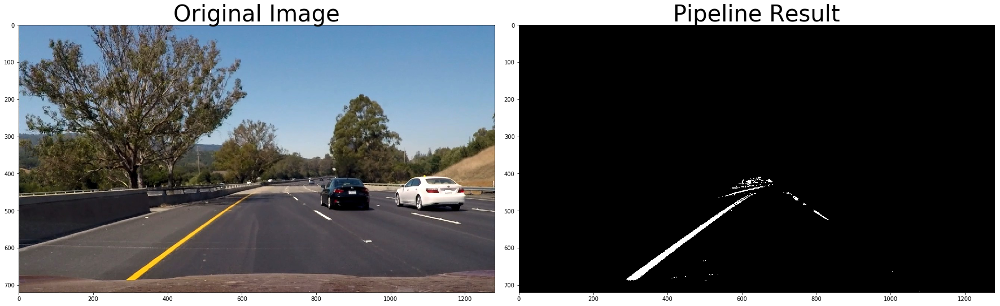

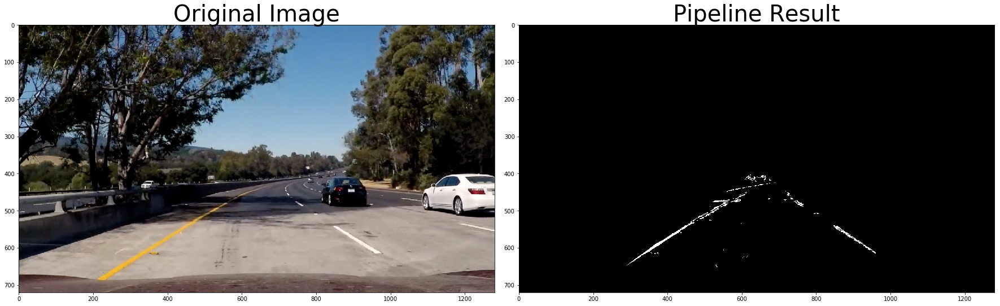

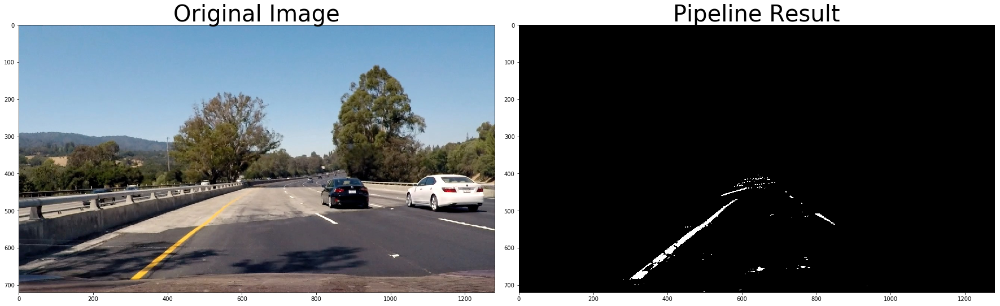

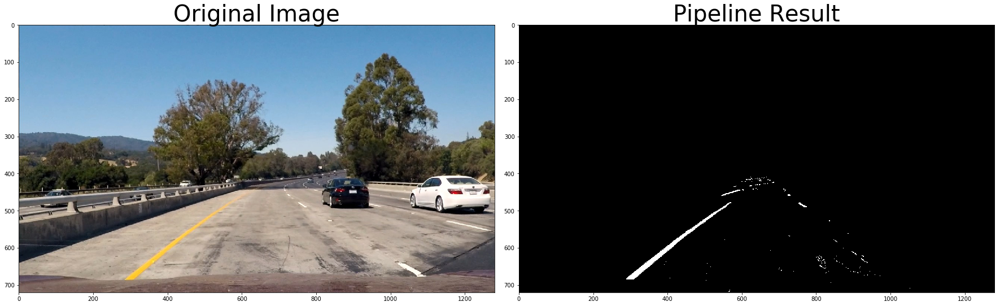

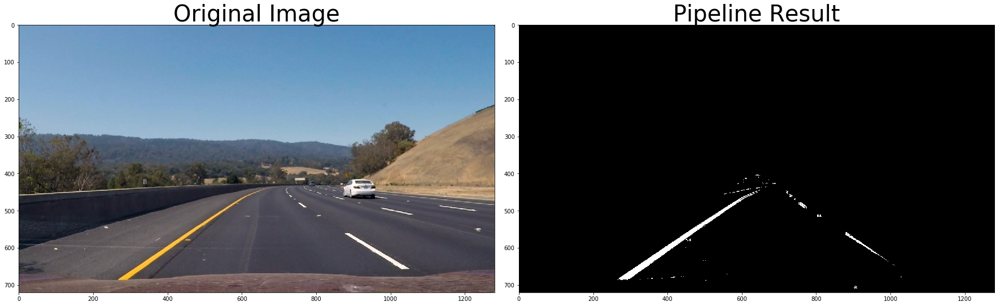

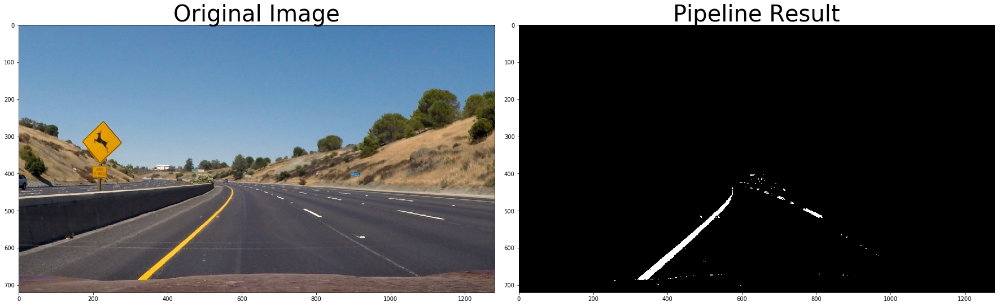

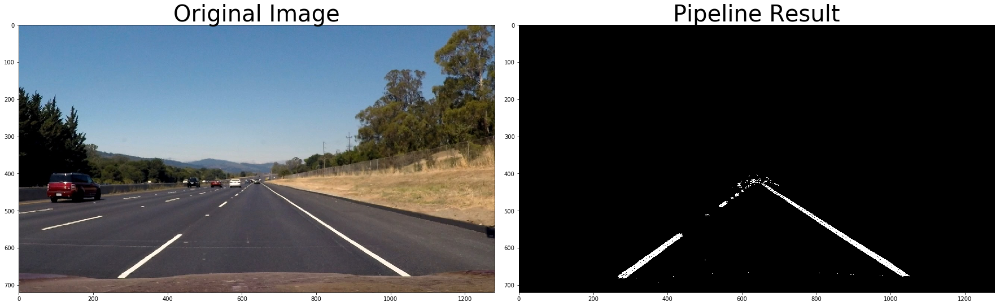

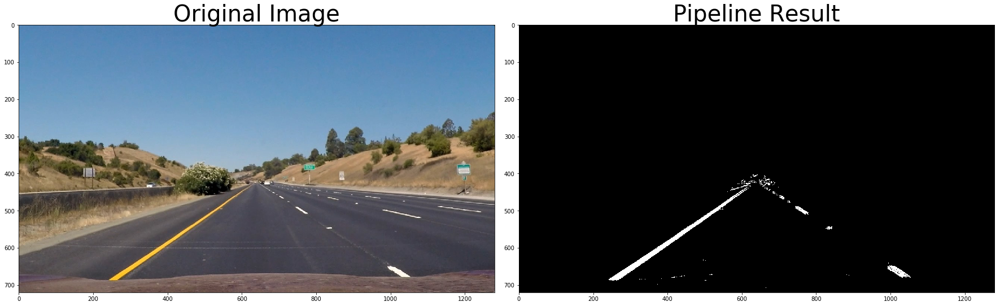

In [6]:
def lanePixel_pipeline(image):
    """
    output: image with lane line pixels drawn
    """
    # convert to gray scale
    gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
    # take out the saturation channel
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    s = hls[:,:,2]

    # Define a kernel size and apply Gaussian smoothing
    kernel_size_GB = 5
    blur_gray = cv2.GaussianBlur(gray,(kernel_size_GB, kernel_size_GB),0)
    
    # Define the kernel size for sobel operator
    kernel_size_sobel = 7
    
    # Apply sobel thresholdings to single out lane pixels
    gradx = abs_sobel_thresh(gray, orient='x', sobel_kernel=kernel_size_sobel, thresh=(12, 255))
    grady = abs_sobel_thresh(gray, orient='y', sobel_kernel=kernel_size_sobel, thresh=(62, 255))
    mag_binary = mag_thresh(gray, sobel_kernel=kernel_size_sobel, mag_thresh=(42, 255))
    dir_binary = dir_threshold(gray, sobel_kernel=kernel_size_sobel, thresh=(.66, 1.0))
    
    # Define our parameters for Canny and apply
    edges = cv2.Canny(blur_gray, 50, 150)
    
    # Threshold saturation 
    s_binary = np.zeros_like(dir_binary)
    s_binary[(s > 170) & (s < 256)] = 1#160,255
    
    # Combine the thresholdings
    combined = np.zeros_like(dir_binary)
    combined[ (((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))) | (s_binary == 1)] = 1
#     combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    # Mask the region of interest
    imshape = image.shape
    vertices = np.array([[(190,imshape[0]),
                          (imshape[1]-166,imshape[0]),
                          (imshape[1]//2+16,imshape[0]//2+42), 
                          (imshape[1]//2-18,imshape[0]//2+42)]], dtype=np.int32)   
    result = region_of_interest(combined,vertices) 
    return result


#test the pipeline
filenames = os.listdir("test_images/")
path = os.path.abspath("test_images/")
savepath = os.path.abspath("test_images_output/")
for filename in filenames:
    if not filename.endswith(".jpg"):
        continue
    image_original = cv2.imread(path+"/"+filename)
    image = np.copy(image_original)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    result = lanePixel_pipeline(image)
    # Plot the result
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)

    ax2.imshow(result, cmap='gray')
    ax2.set_title('Pipeline Result', fontsize=40)
   
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Perspective transformation

Warp the front-camera images to get the bird-eye perspective. Calculate this perspective transformation matrix and the inverse transformation matrix for future usage.

### What is means by bird-eye perspective? 
The region of interest(a trapezoidal region)in front of the car becomes a rectangle filled the image from bottom to top.

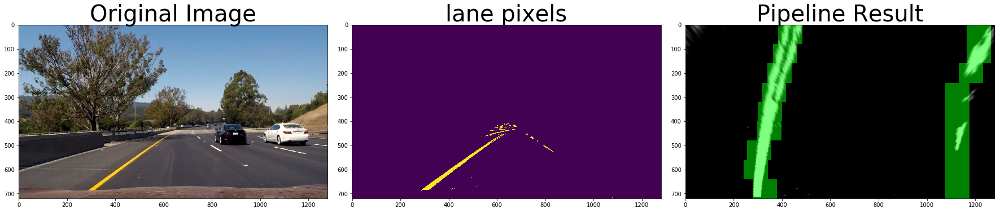

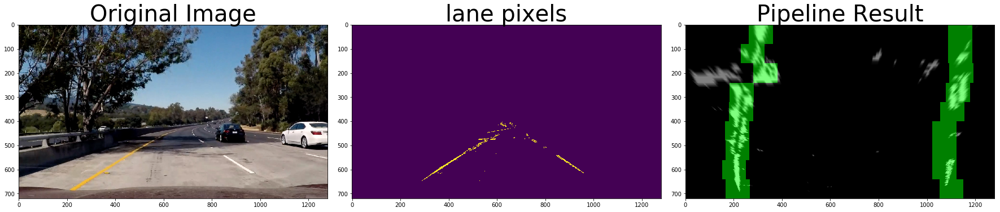

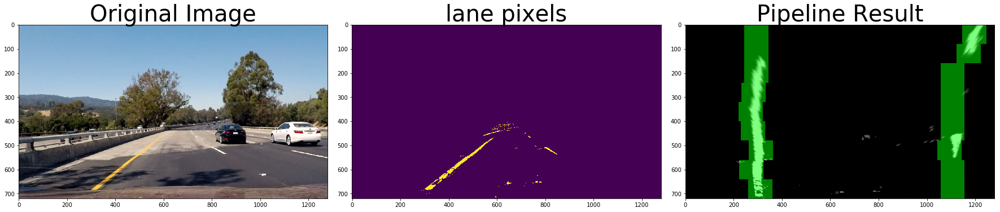

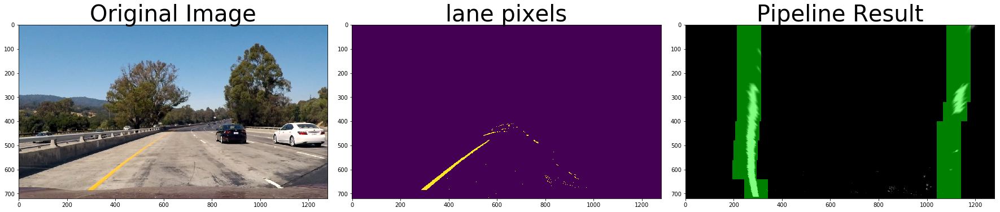

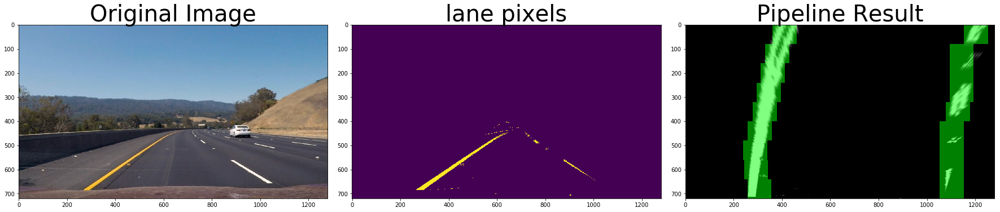

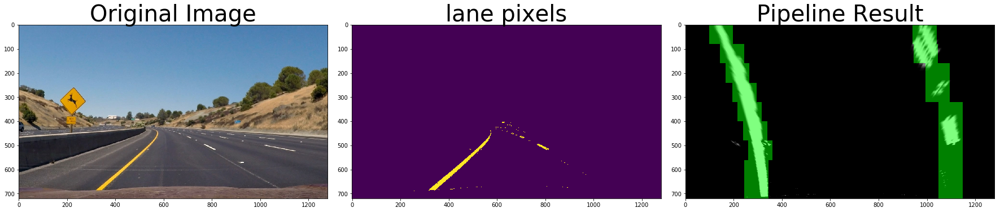

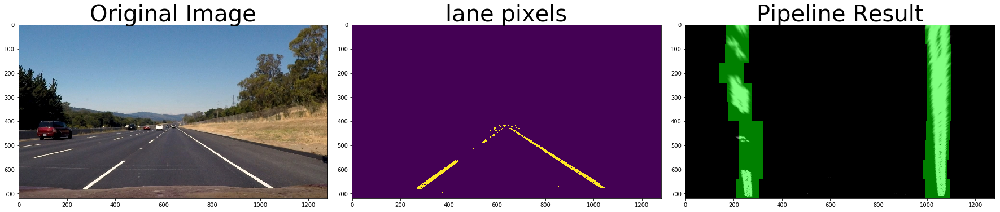

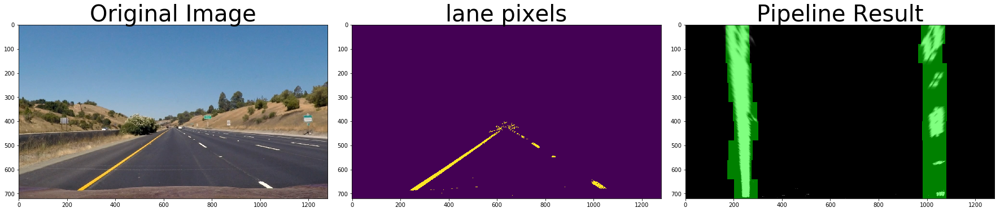

In [7]:
def warp_RoI(img,mtx, dist):
    """
    perspective transformation for the region of interest
    """
    imshape = img.shape 
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # source vertices, vertices of the region of interest
    src =np.float32([[150,imshape[0]],
                [imshape[1]-150,imshape[0]], 
                [imshape[1]//2+70,imshape[0]//2 + 100], 
                [imshape[1]//2-60,imshape[0]//2 + 100]])     
    # destination vertices, a rectangle in the center of the image 
    dst = np.float32([[200, imshape[0]], 
                      [imshape[1]-200, imshape[0]], 
                      [imshape[1]-200, 0], 
                      [200, 0]])
    # Given src and dst points, calculate the perspective transform matrix and the inverse transfrom matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Perform perspective transformation for the input image
    warped = cv2.warpPerspective(undist, M, imshape[::-1])#1280*720
    return warped, M, Minv
                      
# Use slide window search to find lane pixels
def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def window_selection(width, height, img_ref, center,level):
    """
    select non zero pixels inside a window
    return y and x coordinates
    """
    window = np.argwhere(img_ref[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),
                     max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])])
    y = window.T[0] + height*level
    x = window.T[1] + center - width/2
    return (y,x)
                      
def find_window_centroids(image, window_width, window_height, margin):
    """
    use slide window search to find lane pixels
    """
    conv_threshold = window_width*window_height*10
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum half bottom of image to get slice, could use a different ratio
    l_sum = np.sum(image[int(image.shape[0]/2):,:int(image.shape[1]/2)], axis=0)#(640,) left half histogram
    #shape after convolve: len(args[0])//2 + len(args[1])
    #np.convolve: first filp the second array, then slide it across the first array
    l_center = np.argmax(np.convolve(window,l_sum)) - window_width/2 
    r_sum = np.sum(image[int(image.shape[0]/2):,int(image.shape[1]/2):], axis=0)#(640,) right half histogram
    r_center = np.argmax(np.convolve(window,r_sum)) - window_width/2 + int(image.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(image.shape[0]/window_height)):
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(image[int(image.shape[0]-(level+1)*window_height):int(image.shape[0]-level*window_height),:], axis=0)
#         print("image_layer max: {} min: {}".format(np.max(image_layer),np.min(image_layer)))
        conv_signal = np.convolve(window, image_layer)
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width/2
        l_min_index = int(max(l_center+offset-margin,0))
        l_max_index = int(min(l_center+offset+margin,image.shape[1]))
        sum_conv_signal_left = np.sum(conv_signal[l_min_index:l_max_index])
#         print("level {}, sum_conv_singal {}".format(level, sum_conv_signal_left))
        if sum_conv_signal_left > conv_threshold:
            l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
        else:
            l_center = window_centroids[-1][0]
        # Find the best right centroid by using past right center as a reference
        r_min_index = int(max(r_center+offset-margin,0))
        r_max_index = int(min(r_center+offset+margin,image.shape[1]))
        sum_conv_signal_right = np.sum(conv_signal[r_min_index:r_max_index])
#         print("        right, sum_conv_singal {}".format( sum_conv_signal_right))
        if sum_conv_signal_right > conv_threshold:
            r_center = np.argmax(conv_signal[r_min_index:r_max_index])+ r_min_index-offset
        else:
            r_center = window_centroids[-1][1]
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))
    return window_centroids
  
filenames = os.listdir("test_images/")
path = os.path.abspath("test_images/")
savepath = os.path.abspath("test_images_output/")
for filename in filenames:
    if not filename.endswith(".jpg"):
        continue
    image_original = cv2.imread(path+"/"+filename)
    image = np.copy(image_original)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # thresholding lane pixels
    lane_pixel_img = lanePixel_pipeline(image)# 0-1
    # perspective transformation
    warped, M, Minv = warp_RoI(lane_pixel_img, mtx, dist)
   
    
    # slide window search
    # window settings
    window_width = 100 
    window_height = 80 # Break image into 9 vertical layers since i
    margin = 100 # How much to slide left and right for searching
    window_centroids = find_window_centroids(warped, window_width, window_height, margin)
    # If we found any window centers
    if len(window_centroids) > 0: 
        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage= (np.dstack((warped, warped, warped))*255).astype(np.uint8) # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 0.5, template, 0.5, 0.0) # overlay the orignal road image with window results
    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
    # Plot the result
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)
    
    ax2.imshow(lane_pixel_img)
    ax2.set_title('lane pixels', fontsize=40)
    
    ax3.imshow(output, cmap='gray')
    ax3.set_title('Pipeline Result', fontsize=40)
   
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Fit lane pixels to polynomial

In [9]:
def calc_curvature(yvals, fitx):
    # evaluate the curvature at the bottom at the image
    y_eval = np.max(yvals)
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    fit_cr = np.polyfit(yvals*ym_per_pix, fitx*xm_per_pix, 2)
    curverad = ((1 + (2*fit_cr[0]*y_eval + fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*fit_cr[0])
    return curverad

def fit_lanes(warped_image):
    # y coordinate values for plotting
    yvals = np.linspace(0, 100, num=101)*7.2
    # slide window search
    # window settings
    window_width = 100 
    window_height = 80 # Break image into 9 vertical layers since i
    margin = 100 # How much to slide left and right for searching
    window_centroids = find_window_centroids(warped_image, window_width, \
                                             window_height, margin)    
    #store x and y coordinates for lane line pixels
    left_x_coord = []
    left_y_coord = []
    right_x_coord = []
    right_y_coord = []

    for level, two_centroids in enumerate(window_centroids):
        left_center = two_centroids[0]
        right_center = two_centroids[1]
        left_window_pixel_coords = window_selection(window_width,
                                                    window_height,
                                                    warped_image,
                                                    left_center,
                                                    level)
        right_window_pixel_coords = window_selection(window_width,
                                                     window_height,
                                                     warped_image,
                                                     right_center,
                                                     level)
       
        left_y_coord.extend(list(left_window_pixel_coords[0]))
        left_x_coord.extend(list(left_window_pixel_coords[1]))
        right_y_coord.extend(list(right_window_pixel_coords[0]))
        right_x_coord.extend(list(right_window_pixel_coords[1]))

    
    left_x_coord = np.array(left_x_coord)
    left_y_coord = np.array(left_y_coord)
    right_x_coord = np.array(right_x_coord)
    right_y_coord = np.array(right_y_coord)
#     print("left y max: {} left x max: {}".format(np.max(left_y_coord),np.max(left_x_coord)))

    # fit to polynomials
    left_coeff = np.polyfit(left_y_coord, left_x_coord, 2)
    if len(right_y_coord)>4000:
        right_coeff = np.polyfit(right_y_coord, right_x_coord, 2)
    else:# too few points to fit a good curve
        right_coeff = [left_coeff[0],left_coeff[1],left_coeff[2]+ 790]
#     print("left lane pixels: {} right: {}".format(len(left_y_coord),len(right_y_coord)))
    # take the average of non-constant term, assume two lines are parallel
#     print("left_coeff: {}, right_coeff: {}".format(left_coeff, right_coeff))
#     a = (left_coeff[0])
    left_ploty_x = left_coeff[0]*yvals**2 + left_coeff[1]*yvals + left_coeff[2]
    right_ploty_x = right_coeff[0]*yvals**2 + right_coeff[1]*yvals + right_coeff[2]
    # calc curvatures
    left_curverad  = calc_curvature(yvals, left_ploty_x)
    right_curverad = calc_curvature(yvals, right_ploty_x)
     
    return yvals, left_ploty_x, right_ploty_x, left_curverad

# filenames = os.listdir("test_images/")
# path = os.path.abspath("test_images/")
# savepath = os.path.abspath("test_images_output/")
# for filename in filenames:
#     if not filename.endswith(".jpg"):
#         continue
#     image_original = cv2.imread(path+"/"+filename)
#     image = np.copy(image_original)
#     image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#     # thresholding lane pixels
#     lane_pixel_img = lanePixel_pipeline(image)# 0-1
#     # perspective transformation
#     warped, M, Minv = warp_RoI(lane_pixel_img, mtx, dist)
# #     # plot
# #     f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
# #     f.tight_layout()

# #     ax1.imshow(image)
# #     ax1.set_title('Original Image', fontsize=40)
    
# #     ax2.imshow(warped)
# #     ax2.set_title('Warped Image', fontsize=40)
# #     plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
#     yvals, left_ploty_x, right_ploty_x, left_curverad = fit_lanes(warped)
   
    

### Draw the fitted curve on the original image
Curvature values look good, we can draw the fitted curve on original image with the help of inverse perspective transformation.

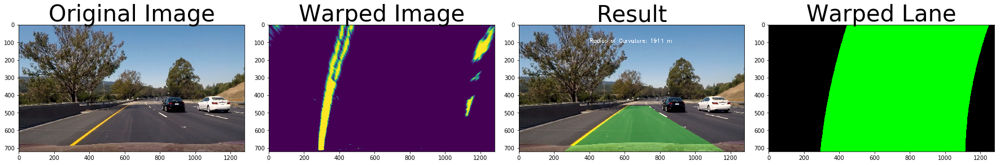

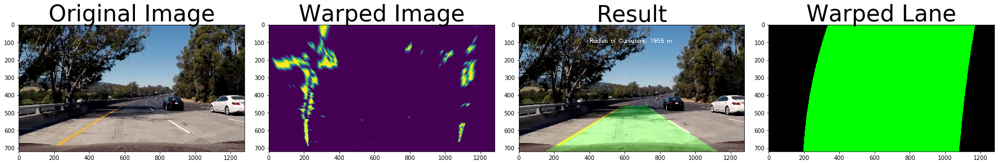

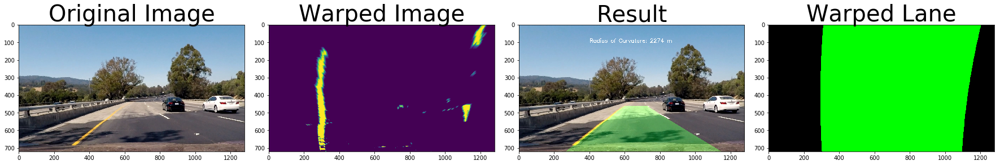

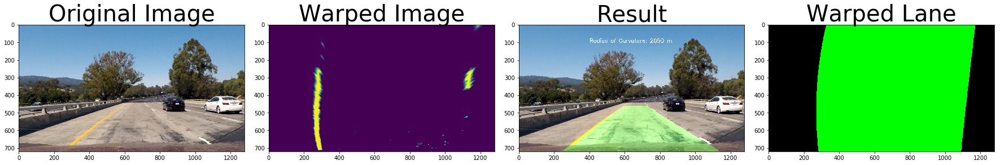

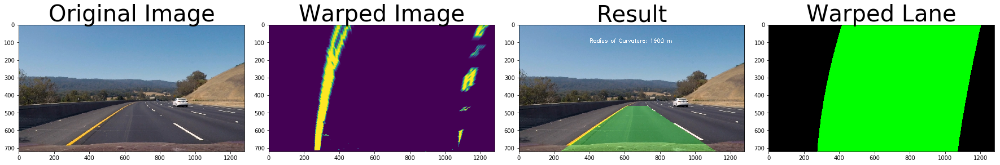

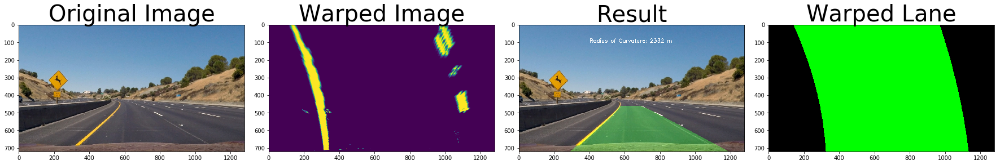

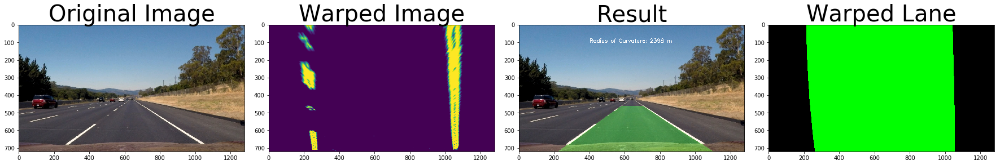

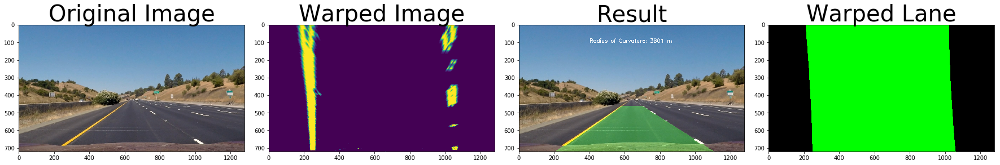

In [10]:
# draw fitted curve on image
def draw_curve(image, warped, yvals, left_ploty_x, right_ploty_x, Minv, curvature):
    # create an image to draw the curves
    curve_img = np.zeros_like(warped).astype(np.uint8)
    color_curve_img = np.dstack((curve_img, curve_img, curve_img))
    # prepare lane points for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_ploty_x, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_ploty_x, yvals])))])
    pts = np.hstack((pts_left, pts_right))
    # draw the lane area
    cv2.fillPoly(color_curve_img, np.int_([pts]), (0, 255, 0))
    color_curve_img = color_curve_img[::-1,:]#flip upside down
    # transform the perspective to the front camera angle
    color_curve_img_fc = cv2.warpPerspective(color_curve_img, Minv, (image.shape[1], image.shape[0])) 
    # lay on original image
    result = cv2.addWeighted(image, 1, color_curve_img_fc, 0.3, 0)
    # add text on an image
    font = cv2.FONT_HERSHEY_SIMPLEX
    text = "Radius of Curvature: {} m".format(int(curvature))
    cv2.putText(result,text,(400,100), font, 1,(255,255,255),2) 
    return color_curve_img, result

filenames = os.listdir("test_images/")
path = os.path.abspath("test_images/")
savepath = os.path.abspath("output_images/")
for filename in filenames:
    if not filename.endswith(".jpg"):
        continue
    image_original = cv2.imread(path+"/"+filename)
    image = np.copy(image_original)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # thresholding lane pixels
    lane_pixel_img = lanePixel_pipeline(image)# 0-1
    # perspective transformation
    warped, M, Minv = warp_RoI(lane_pixel_img, mtx, dist)
    yvals, left_ploty_x, right_ploty_x, curvature = fit_lanes(warped)
    #get result image
    color_curve_img, result = draw_curve(image, warped, yvals, left_ploty_x, right_ploty_x, Minv, curvature)
    # Plot the result
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=40)
    
    ax2.imshow(warped)
    ax2.set_title('Warped Image', fontsize=40)
    
    ax3.imshow(result, cmap='gray')
    ax3.set_title('Result', fontsize=40)
    
    ax4.imshow(color_curve_img, cmap='gray')
    ax4.set_title('Warped Lane', fontsize=40)
   
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    #save the output images
    cv2.imwrite(savepath+"/"+filename,cv2.cvtColor(result, cv2.COLOR_RGB2BGR))

## Pipeline for processing videos
We now have functionality of processing a single image. We can start processing videos by applying the pipeline for a single image to each frame.

In [12]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

def process_image(image):
     # thresholding lane pixels
    lane_pixel_img = lanePixel_pipeline(image)# 0-1
    # perspective transformation
    warped, M, Minv = warp_RoI(lane_pixel_img, mtx, dist)
    yvals, left_ploty_x, right_ploty_x, curvature = fit_lanes(warped)
    #get result image
    color_curve_img, result = draw_curve(image, warped, yvals, left_ploty_x, right_ploty_x, Minv, curvature)
    return result
    

project_video_output = 'project_video_output.mp4'#
clip1 = VideoFileClip("project_video.mp4")
project_output_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time project_output_clip.write_videofile(project_video_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [05:41<00:00,  3.69it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 16min 29s, sys: 2min 3s, total: 18min 32s
Wall time: 5min 42s


In [13]:
# apply to challenge video
challenge_video_output = 'challenge_video_output.mp4'#
clip1 = VideoFileClip("challenge_video.mp4")
challenge_output_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time challenge_output_clip.write_videofile(challenge_video_output, audio=False)

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4


100%|██████████| 485/485 [02:04<00:00,  3.90it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 6min 11s, sys: 45.3 s, total: 6min 57s
Wall time: 2min 5s


In [14]:
# apply to harder challenge video
harder_challenge_video_output = 'harder_challenge_video_output.mp4'#
clip1 = VideoFileClip("harder_challenge_video.mp4")
harder_challenge_output_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time harder_challenge_output_clip.write_videofile(harder_challenge_video_output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4


100%|█████████▉| 1199/1200 [05:23<00:00,  3.70it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

CPU times: user 15min 48s, sys: 1min 53s, total: 17min 41s
Wall time: 5min 24s
